# Numerical simulation of the wave equation in 1D using Finite Difference

## Import libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML
import sys

----

## Create domain model properties (i.e. speed of waves), and discretisation grid

In [2]:
nx = 801  # 801 grid sample-points along the x-axis

# start with homogeneous model - same wave-speed everywhere.
c = np.full(nx,1500.0)  # Note: 1500m/s is typical acoustic velocity of water

# a faster section, halfway across model, to show reflection of waves when crossing sharp interface
c[400:] = 2500.0  # Note: 2500m/s is fairly typical acoustic velocity of sedimentary rock

In [3]:
length = 6000.0  # assign a length to the model in metres

dx = length/(nx-1)  # calculate the spatial increment between model parameters

print('Domain is %.1fm (%d sample-points)' % (length,nx))
print('Sample-point spacing (dx) is %.5fm' % (dx))

Domain is 6000.0m (801 sample-points)
Sample-point spacing (dx) is 7.50000m


In [4]:
def plot_model(c):
    plt.figure(figsize=(10,6))
    plt.plot(c) # plotting the velocity model
    plt.xlabel('x grid-points')
    plt.ylabel('speed (m/s)')
    plt.title('Velocity Model (m/s)')
    plt.show()

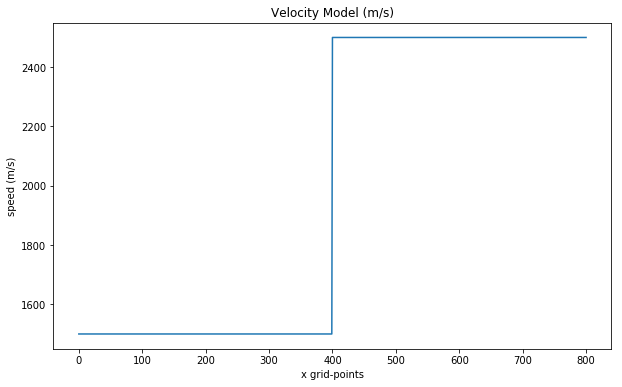

In [5]:
plot_model(c)

----
## Modelling constraints
#### CFL stability condition should be satisfied – the 'Courant number'.

The dimensionless Courant number, $C$, gives a measure of how far a signal will travel across a grid-cell (/between grid-points) within one time-step.
(Hence why I will very often refer to it as 'the crossing factor'.)

The crossing factor is $c$.$\delta t$/$\delta x$ for speed $c$, and we want the maximum value of this within the whole domain to satisfy some constraint that depends upon the finite-difference stencil(s) in use when modelling.

i.e. we want:$\quad \text{max}(c)$.$\delta t/\delta x <= C_{max}$, where $\ C_{max}$ depends on the discretisation.

We can turn this around to find the maximum time-step for our model and grid-spacing, given $C_{max}$ for our discretisation:

$$\delta t_{best} = \frac{C_{max}\ \delta x}{\text{max}(c)}$$

#### This simple stencil (2nd order), with 2nd order time-stepping, for the 1d wave equation, allows max crossing factor to be up to 1.0
(i.e. can only cross up to 100% of a cell in one time-step – but we'll use 80% below.)

In [6]:
C = 0.8  # set the dimensionless max Courant number that we want to use to work out time-step below

In [7]:
time = 5.0  # desired length of the simulation in seconds
dt = (C*dx)/c.max()  # define the best time-step by using the max Courant number
nt = int(time/dt+0.9999)  # find how many steps are needed to cover that time
time = nt*dt  # turn that back into exact time for this number of steps
print('Time-step = %.5fs  Number of steps = %d  (Total time being modelled: %.5fs)' % (dt,nt,dt*nt))

Time-step = 0.00240s  Number of steps = 2084  (Total time being modelled: 5.00160s)


### Create source function (Ricker wavelet with 6Hz peak frequency)

In [8]:
# want to locate the source at some point in the grid
sx = 150  # this is somewhat towards the left side (domain has 801 sample-points)

The Ricker wavelet used here is a function of time that's defined from the second derivate of a Gaussian function (which is $G(t)=\text{e}^{-a^2 t^2}$).

–It's also known as the Mexican hat wavelet, due to its shape when plotted as a function of two variables.

It can be written so it is symmetric about time zero, with maximum at that time, ultimately decaying towards zero as $t$$\rightarrow$$±\infty$. However, we will shift it in time so that it starts near zero at our time zero.

After differentiating above Gaussian, $G(t)$, twice, flipping, then scaling (and before shifting in time), we get: $\quad R(t) = (1-2a^2 t^2)\ \text{e}^{-a^2 t^2}$

The peak frequency of the Ricker wavelet is at $f$=$a/\pi$.

The length of the wavelet, in time, before it decays close enough to zero for our purposes, is about $\frac{2.1}{f}$ (i.e. about $\frac{1.05}{f}$ seconds each side of the wavelet's central peak).

In [9]:
def ricker_source(freq,dt,ampl):
    ts = 2.1/freq  # the length in time is related to frequency
    ns = int(ts/dt+0.9999)  # figure out how many time-steps are needed to cover that time
    src = np.zeros(ns)  # create array with new length, for wavelet
    print('Length of source is %d steps (%.5f secs, was %.5fs)' % (ns,ns*dt,ts))
    ts = ns*dt  # and now turn that back into a time that's exactly the required number of steps
    a2 = (freq*np.pi)**2  # a squared (see equation above)
    t0 = ts/2 - dt/2  # midpoint time of wavelet

    for ix in range(ns):
        src[ix] = ampl*(1.0-2.0*a2*(ix*dt-t0)**2)*np.exp(-a2*(ix*dt-t0)**2)

    print('Endpoint values are: %.6f %.6f' % (src[0],src[-1]))
    return src,ns

In [10]:
# an alternative source function to try out (sine-squared 'bump')
def sinesq_source(ns,ampl):
    src = np.zeros(ns)
    for i in range(ns):
        src[i] = ampl*np.sin((0.5+i)*np.pi/ns)**2
    return src

In [11]:
src,ns = ricker_source(6.0,dt,1.0)  # Use a 6Hz Ricker wavelet

#src = sinesq_source(ns,1.0)  # try alternative source function instead

Length of source is 146 steps (0.35040 secs, was 0.35000s)
Endpoint values are: -0.000437 -0.000437


In [12]:
def plot_source(src):
    plt.figure(figsize=(10,6))
    plt.plot(src) # plot source function
    plt.xlabel('timesteps')
    plt.ylabel('amplitude')
    plt.title('Source function')
    plt.show()

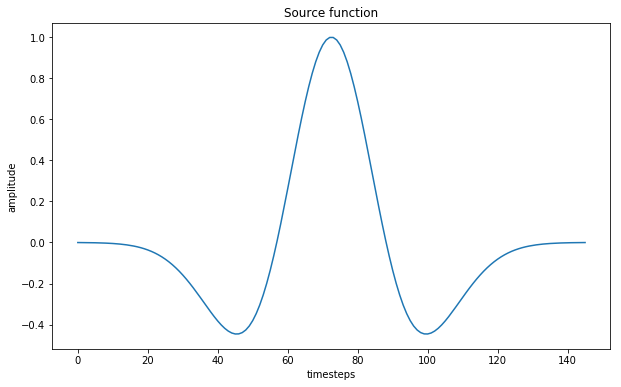

In [13]:
plot_source(src)

### Check that the maximum frequency in the source function can propagate reliably

For a simple second-order finite-difference, the minimum wavelength of a signal that we can propagate reliably over a reasonable distance is about 10 grid-points.

In [14]:
# minimum of 10 cells per wavelength for reasonably accurate propagation (i.e. minimal numerical dispersion):
min_cells_per_wl = 10.0

# calculate the max frequency that can be modelled without numerical dispersion:
max_freq = c.min()/(min_cells_per_wl*dx)

print('Maximum reliable propagation frequency is about %.1fHz' % max_freq)

Maximum reliable propagation frequency is about 20.0Hz


#### Want to avoid causing too much dispersion by keeping maximum significant frequency within this limit...

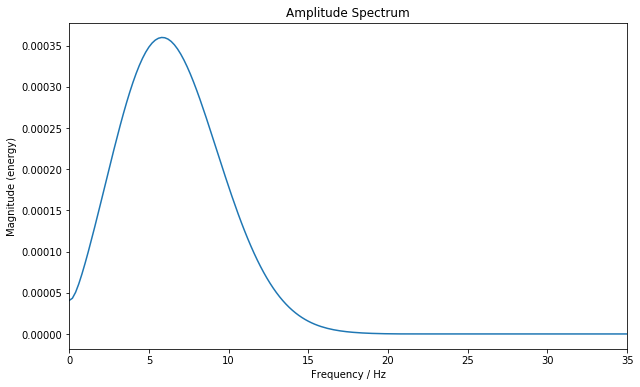

In [15]:
# plot amplitude spectrum of source function
plt.figure(figsize=(10,6))
plt.magnitude_spectrum(np.append(src,np.zeros(nt-ns)), Fs=1/dt)  # note padding to nt points
plt.title('Amplitude Spectrum')
plt.xlim(0,35)
plt.xlabel('Frequency / Hz')
plt.show()

----
## Create absorbing layers

$$\text{With absorbing layers, the 2nd-order time discretisation becomes:}$$

$$(1+q)\ u^{\tau+1}(x)\ \approx \ \delta t^2c(x)^2\ 
\frac{\partial^2 u^\tau(x)}{\partial x^2}\ +\ (2-q^2)\ u^\tau(x)\ -\ 
(1-q)\ u^{\tau-1}(x)$$

$$\text{Where:}\quad q\ =\ \alpha \frac{c(x)\delta t}{\delta x}\quad
\text{(note that above collapses back to original version for $\alpha$=0, as we would expect)}$$

The array `a` currently gets created in the code cell below so it contains all zeros (one for each gridpoint), but we want to put in some values to create absorbing layers at either end of the domain. So...

>**Task 1:**
>
>**Create two layers of width 60 gridpoints, one at each side of the domain, where `a` should contain value 1.0.**  
>
>**Once you have filled in the code, skip the task 2 & 3 code-cells, and go straight to the code-cell that defines the `plot_absorbing` function – you can use this to check that your absorbing layers look right.**  
>
>**Go to the `propagate` function further down this notebook, and make the appropriate changes to the code in the time-stepping loop to include the absorption (where indicated), then try it out.**  
> – Does this reduce the reflections from the domain boundaries?  
> – Is the wavefield completely absorbed by the absorbing layers?  
> – Describe what happens... (where do you see reflections appear from now?)  
> – Try changing `absfact` up/down a bit (e.g. double it & half it) –how does it change behaviour?
>


In [18]:
# The array a below will eventually contain the 'q' from the equation given above, but only after
# it has been multiplied by the c.dt/dx, and by the scaling factor 'absfact'.
# Before then, any values it contains only need to be in range zero to one.

a = np.zeros(nx)  # create array with zeros


# FILL IN CODE HERE TO BUILD ABSORBING LAYERS with constant value 1 at each end of the domain (task 1)...

a[:60]  = 1.0  # left layer
a[-60:] = 1.0  # right layer

absfact = 0.04  # this will be the initial scaling factor we'll try for the absorbing layers

Instead of switching on the absorption abruptly, we need to 'ramp' it up gradually. So...  

>**Task 2:**
>
> **Set up `a` to make a linear ramp that goes from zero up to one when it reaches the domain boundary.**  
> – Is this better than the constant layer above?  
> – Can you improve on it further by tweaking `absfact` up/down a bit?  
> – How does it behave – what features do you see in the reflection near edges as you change `absfact`?

In [36]:
# FILL IN CODE HERE TO BUILD LINEAR RAMP ABSORBING LAYERS (task 2)...

a[:] = 0.0  # initialise array with zeros

# left and right absorbing layers
for i in range(1,61):  # sixty cells in layers
    a[60-i]   = 1.0*i/60  # linear increase towards left boundary
    a[i-60-1] = 1.0*i/60  # linear increase towards right boundary

absfact = 0.06  # try slightly changing this, and see how it performs

>**Task 3:**
>
>**Finally, try coding a quadratic ramp from zero to one (rather than linear).**  
> – Is this better than a linear ramp? (You will probably have to look carefully...)  
> – Again, try tweaking `absfact` up/down a bit – how does it change the behaviour of the reflection near edges?  


In [52]:
# FILL IN CODE HERE TO BUILD QUADRATIC RAMP ABSORBING LAYERS (task 3)...

a[:] = 0.0  # initialise array with zeros

# left and right absorbing layers
for i in range(1,61):  # sixty cells in layers
    a[60-i]   = 1.0*i*i/(60*60)  # quadratic increase towards left boundary
    a[i-60-1] = 1.0*i*i/(60*60)  # quadratic increase towards right boundary

# below is for when we try 80 cells instead for absorbing layer on right side
for i in range(1,81):
    a[i-81] = 1.0*i*i/(80*80)  # quadratic increase towards right boundary

absfact = 0.1  # try slightly changing this, and see how it performs

#### Show the absorption coefficient (before scaling by velocity model and other things)

Use the two code-cells below to check that your absorbing layer array `a` contains what you expect.

In [53]:
def plot_absorbing():
    plt.figure(figsize=(10,6))

    plt.title('Absorption')

    plt.plot(a)
    plt.xlabel('x gridpoints')
    plt.ylabel('absorption coefficient')
    plt.show()

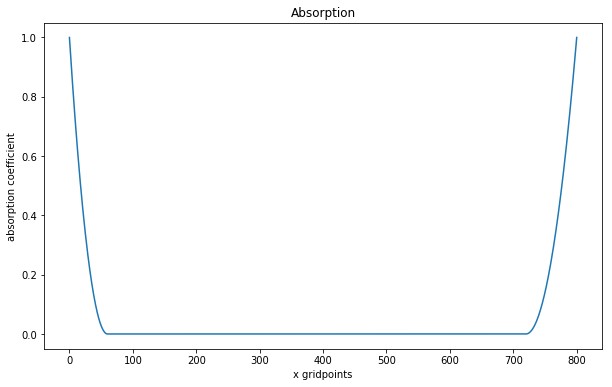

In [54]:
plot_absorbing()

Finish by scaling with velocity and other factors, for direct use in simulation later

In [55]:
# uncomment line below as an easy way to switch off absorbing layers after you have built them
#absfact = 0.0

a[:] = a[:]*c[:]*(dt/dx)*absfact

## Receiver points within domain
–To detect what crosses a few particular points of the domain over time

In [56]:
rpos = np.array([70,100,640])  # put receivers at various grid-points in domain
r = np.zeros((rpos.shape[0],nt))  # an array to store 3 sets of receiver data every step (and to plot later)

----
# Simulation

In [57]:
# Initialise arrays for wavefields
u = np.zeros(nx) # current wavefield
u_prv = np.zeros(nx) # previous wavefield, at t-1
u_nxt = np.zeros(nx) # next wavefield, at t+1

In [58]:
# prepare an array to store wavefield snapshots for plotting
snapshot_gap = 5 # set sampling rate used to store wavefield (every 10 timesteps)
wavefield = np.zeros((int(nt/snapshot_gap), nx)) # array to store wavefields every 10 timesteps
print('Storing %d wavefields (every %dth out of %d)' % (wavefield.shape[0],snapshot_gap,nt))

Storing 416 wavefields (every 5th out of 2084)


In [59]:
# a useful variable – shorthand for something that appears regularly in expressions below
dtdx2 = (dt*dt)/(dx*dx)

In [60]:
def propagate():

    # Make sure everything starts off zero
    u[:] = 0.0
    u_prv[:] = 0.0

    # put first source entry into current wavefield
    u[sx] = src[0]

    # begin time-stepping loop...

    for i in range(nt):

        if i%20==0:
            sys.stdout.write('Done step %d of %d\r' % (i+1,nt))
    
    
        # CHANGE LINE OF CODE INSIDE LOOP BELOW TO INCLUDE ABSORPTION (from task 1)...
    
        # find new wavefield, u_nxt, throughout domain (apart from edges)
        for ix in range(1,nx-1):
            u_nxt[ix] = ( (c[ix]**2) * dtdx2 * (u[ix-1]-2*u[ix]+u[ix+1]) + (2-a[ix]**2)*u[ix] - (1-a[ix])*u_prv[ix] ) \
                            / (1+a[ix])
            # original line was:  u_nxt[ix] = (c[ix]**2) * dtdx2 * (u[ix-1]-2*u[ix]+u[ix+1]) + 2*u[ix] - u_prv[ix]

    
        # put in source function as if it's a 'forced' boundary condition (rather than injecting by adding),
        # up until the source function runs out of steps
        if i+1<ns:
            u_nxt[sx] = src[i+1]

        r[:,i] = u_nxt[rpos[:]]  # record values at receiver points

        # cycle wavefields for next time-step
        u_prv[:] = u[:]
        u[:] = u_nxt[:]
    
        # store the current wavefield u on every Nth step (where N=snapshot_gap, as defined earlier)
        if (i+1)%snapshot_gap == 0:
            wavefield[int((i+1)/snapshot_gap-1),:] = u[:]

    print('Finished all %d steps' % (nt))

In [61]:
propagate()

Finished all 2084 steps


## Plot wavefield at different times

In [62]:
def plot_snapshot(plot_time):
    plt.figure(figsize=(15,5))
    plt.plot(wavefield[int(plot_time/(dt*snapshot_gap)),:])
    plt.title('Wavefield at about %.2fs' % (plot_time))
    plt.xlabel('x grid-points')
    plt.ylabel('amplitude')
    plt.show()

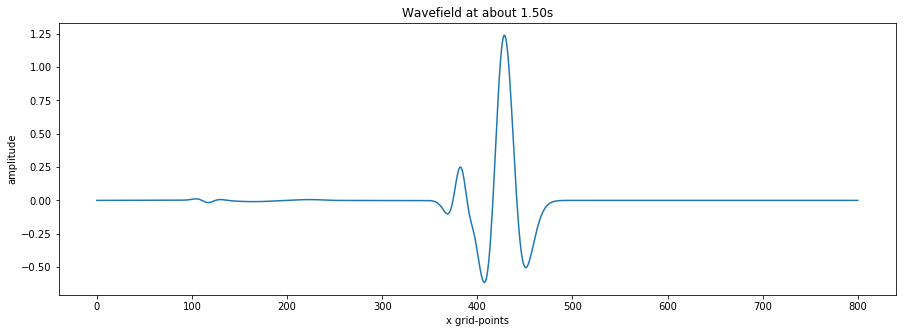

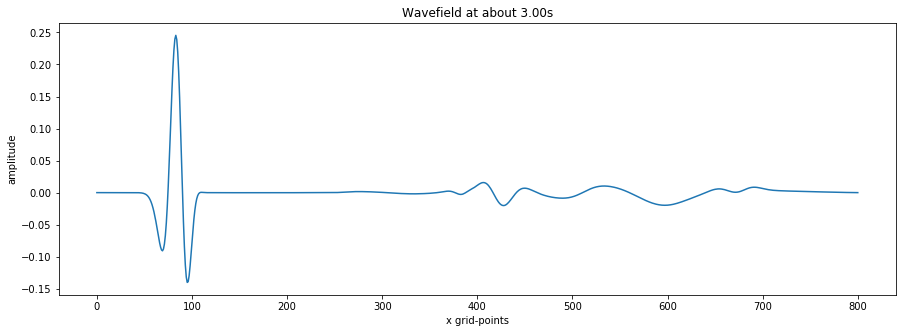

In [63]:
plot_snapshot(1.5)
plot_snapshot(3.0)

## Plot data at receivers

In [64]:
def plot_at_receivers():
    for i in range(r.shape[0]):
        plt.figure(figsize=(15,5))
        plt.plot(r[i])
        plt.title('Data for receiver at grid-point %d' % (rpos[i]))
        plt.ylabel('Amplitude')
        plt.xlabel('Time-steps')
        plt.show()

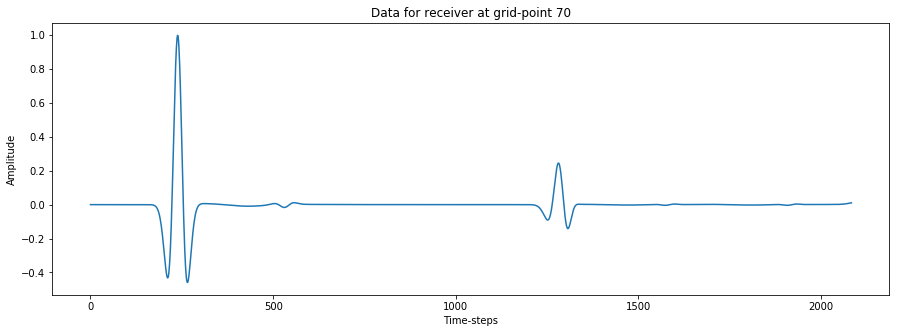

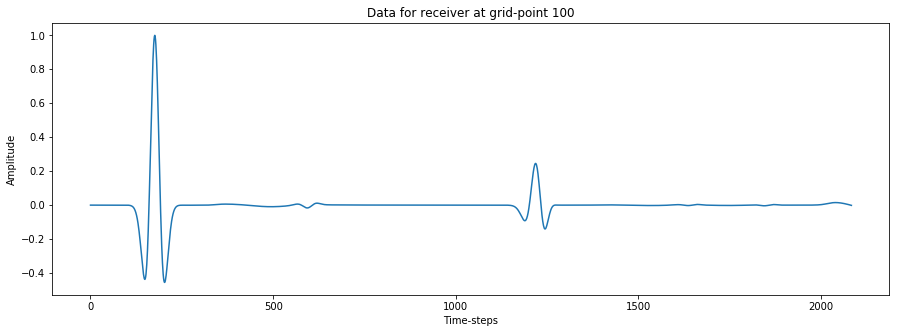

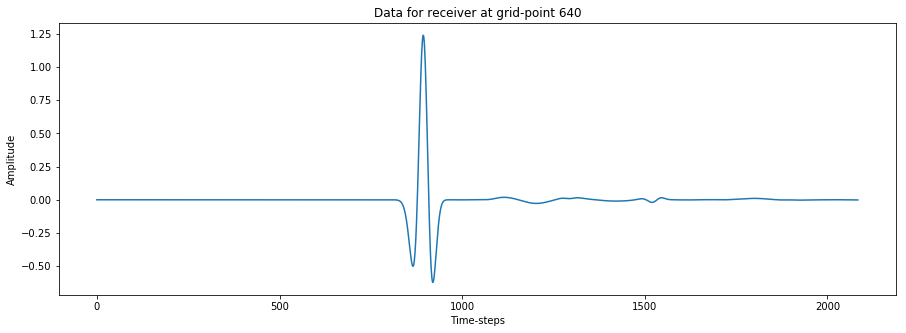

In [65]:
plot_at_receivers()

## Show space-time plot for whole wavefield

In [66]:
def spacetime_plot():
    fig = plt.figure(figsize=(10,8))
    plt.imshow(wavefield, cmap='RdBu', interpolation='bilinear', aspect='auto',
               vmin=-1, vmax=1,       # set the bounds for the colour data
               extent=(0,length,time,0))  # set the bounds for the axes
    plt.title('Wavefield propagation with time')
    plt.xlabel('x-position / m')
    plt.ylabel('Time / s')
    plt.show()

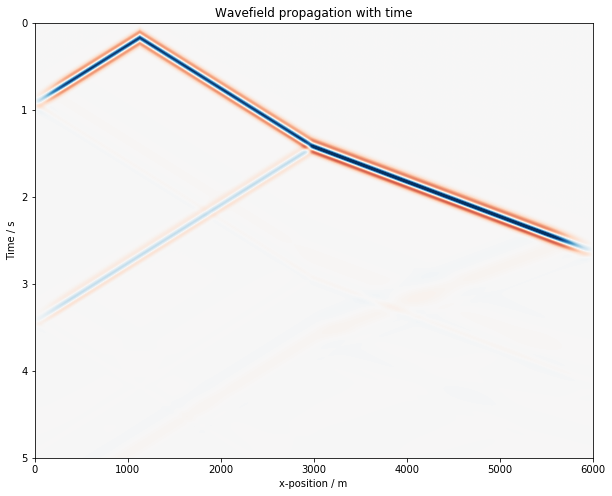

In [67]:
spacetime_plot()

## Make a movie! 

In [34]:
def create_animation():
    fig, ax = plt.subplots(figsize=(15,6))

    x = np.arange(0, wavefield.shape[1], 1)
    line, = ax.plot(x,wavefield[0])

    plt.title('Wavefield')
    plt.xlabel('x gridpoint')
    plt.ylabel('amplitude')
    plt.ylim(-1.3,1.3)

    def frame(i):
        line.set_ydata(wavefield[i])
        return line,

    print('Finished plots for frames, building animation...')

    ani = anim.FuncAnimation(fig, frame, interval=50, save_count=wavefield.shape[0])

    plt.close(fig)  # prevent final image from showing up inline below

    return ani


In [35]:
ani = create_animation()
print('Preparing HTML (takes a little while...)')
HTML(ani.to_jshtml())

Finished plots for frames, building animation...
Preparing HTML (takes a little while...)
